# Assignment

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

## Load the dataset and make your preprocessing like normalizing the data.

In [2]:
# We load the MNIST dataset below
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [3]:
# Select 10000 images randomly and work with this sample
np.random.seed(123)

# Generate a uniform random sample from np.arange(70000) of size 10000
indices = np.random.choice(70000, 10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


In [6]:
# Standardize the data
scaler = StandardScaler().fit(X)
X_scaled = scaler.transform(X)

## Apply PCA to the data and get the first two principal components.

In [7]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by calling fit_transform method with our data
pca_components = pca.fit_transform(X_scaled)

## Using the first two principal components, draw a graph of the data by coloring and labeling the data points as we did in the checkpoint.

In [8]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Do you think PCA solution is satisfactory? Can you distinguish between different classes easily?

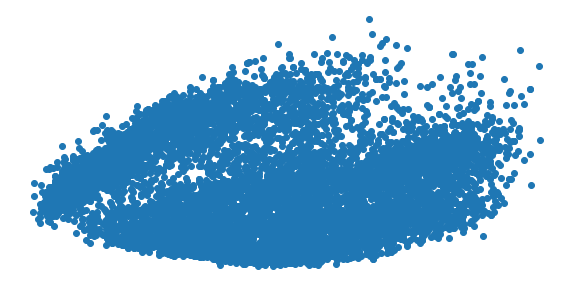

In [9]:
plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

No, the PCA solution is not satisfactory. One cannot distinguish between the different classes (if anything, looks like just two clusters).